# Several tips for online AI competitions


### Before starting,

Participating in online artificial intelligence competitions can be beneficial for your AI studies, **but it can also be harmful at the same time**.

Before using a method that people speak highly of (including models), you must definitely **study what that method is, why it should be used, and why it delivers good results**.


It's not a good idea to focus only on competition rankings or scores without going through these steps.

## 1. Things to be mindful of when participating in online AI competitions

### a. Public / Private score

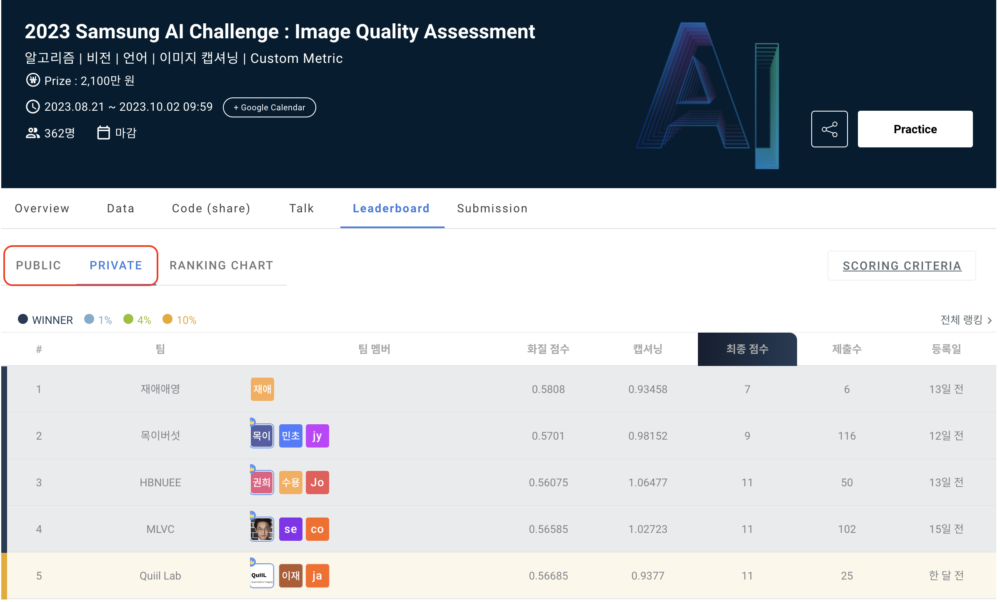

- Most AI competitions **divide the test data into Private and Public subset** using a specific ratio.
- The Public Score is visible on the leaderboard **during the competition**, while the Private Score becomes available on the leaderboard **after the competition ends**, determining the final ranking.
- Recently, there are also competitions that do not release the test data.

### b. Data leakage

The use of test set information in model training, as shown in the following examples, will result in disqualification:

- Using the test dataset for label encoding or one-hot encoding.
- Using the test dataset for data scaling.
- Utilizing the statistics of the test dataset for handling missing values in the test dataset.
- In addition to the above examples, **any case where the test dataset is used in the model's training constitutes data leakage.**

For more detailed explanations about data leakage, please refer to the following links.
- [Data Leakage(Kaggle)](https://www.kaggle.com/code/alexisbcook/data-leakage/tutorial)
- [Data Leakage에 대한 개인적인 정리입니다(Dacon)](https://dacon.io/en/forum/403895)


## 2. Competition flow


### a. Acquiring domain-specific knowledge

- What is the **purpose** of the competition, and what is the **specific task aligned with that purpose**?
- Try to find and **read review papers** on the relevant task (you can skip this if you are already familiar with the task).
- Check for the **latest state-of-the-art (SOTA) models** and their associated papers and code on [paperswithcode](https://paperswithcode.com/sota).
- There might be hidden SOTA models that are referenced by SOTA papers (search for these on Google Scholar).

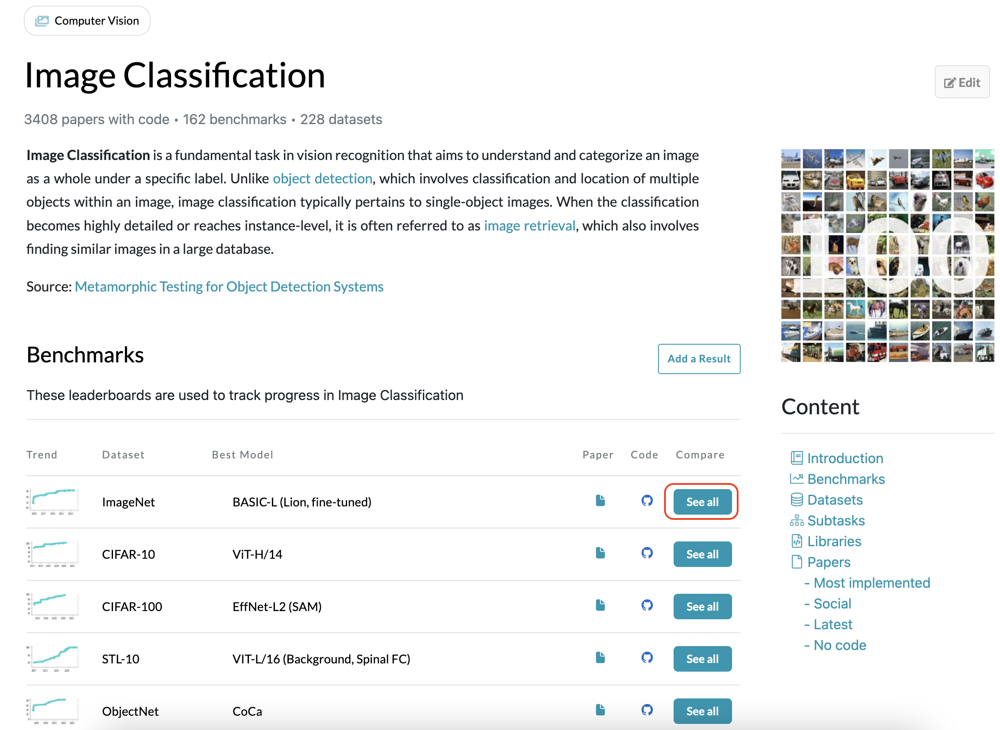

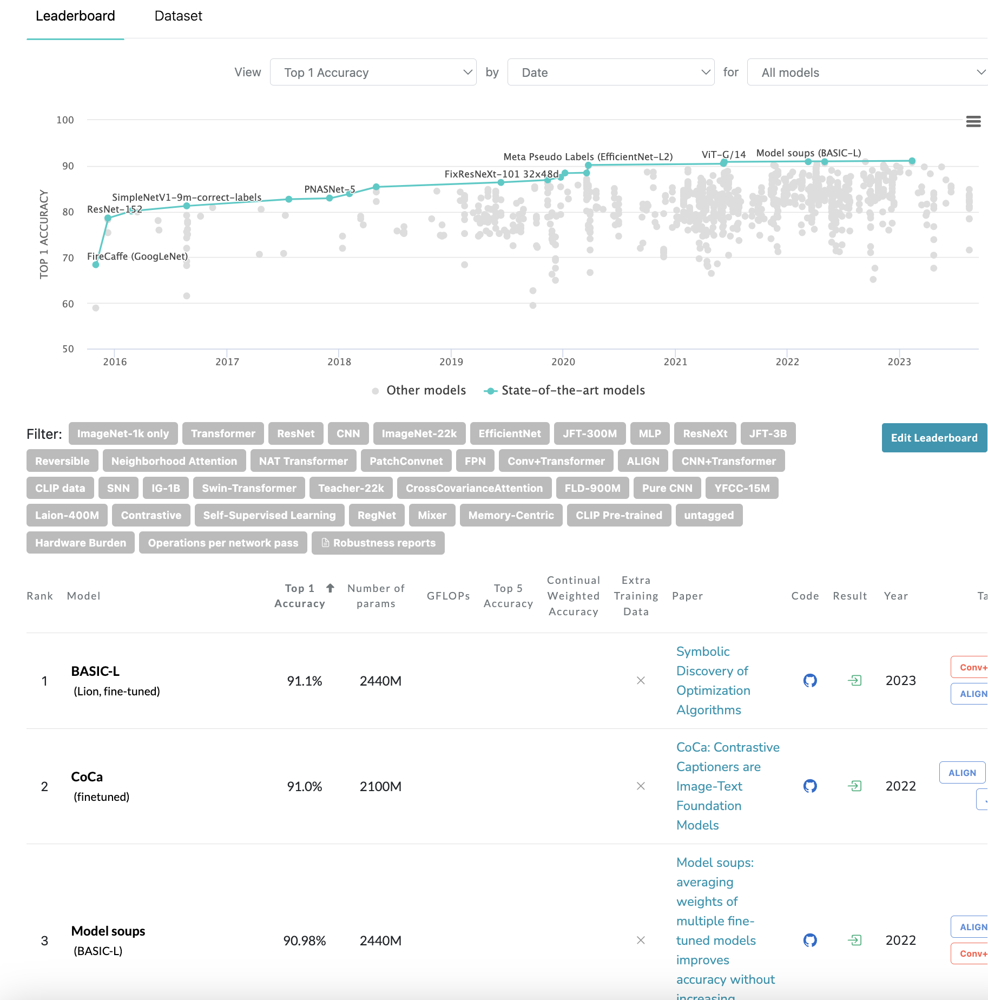

### b. Analyzing the Given Dataset:


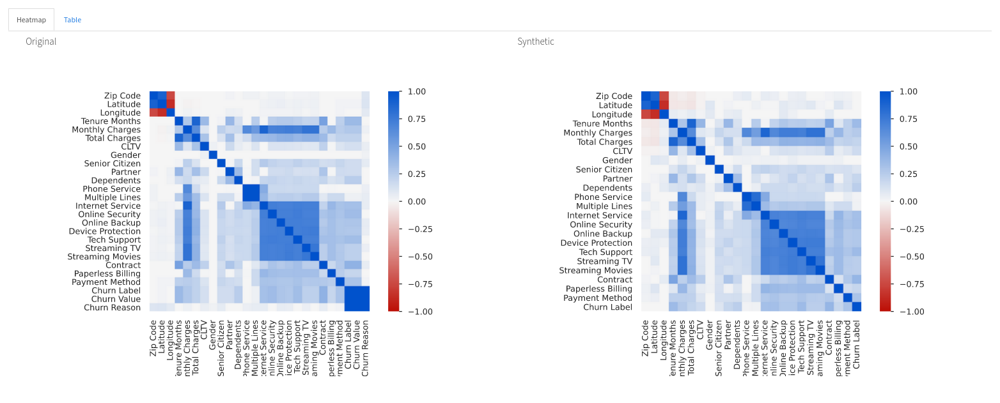

- What **format** was the dataset provided in by the organizers?
  - If the format of the dataset provided by the organizers is different from the format required by the intended SOTA model, is there a conversion method available? If not, can you perform the conversion manually?

- **Investigate the dataset's structure**, including data distribution, central tendencies, and variability. Visualizations like histograms, box plots, and scatter plots can help understand the data's characteristics.

- **Assess the significance of each feature** by examining correlations, statistical tests, or feature importance scores. This helps identify which features are likely to have the most impact on the model's performance.

- In classification tasks, **analyze the distribution of classes** to check for class imbalance or skewness. Understanding class proportions is vital for selecting appropriate techniques to handle imbalanced data.

- If it's a structured data competition, using **auto-EDA(Exploratory Data Analysis)** libraries like `Pandas-profiling`, `Sweetviz`, `Autoviz`, etc., can help save time.

## 3. Helpful and commonly used methods

### a. Validation Strategy

A validation set is crucial when training an AI model for several reasons. The primary purposes of a validation set are:

1. **Model Performance Evaluation**: It helps in assessing how well the model is performing during training. By evaluating the model on a validation set, you can estimate its generalization to unseen data. This prevents overfitting, where a model becomes too specialized in predicting the training data and fails to perform well on new, unseen data.

2. **Hyperparameter Tuning**: During the training process, you might need to adjust hyperparameters (e.g., learning rate, number of layers, batch size). A validation set allows you to compare different models with different hyperparameters and choose the best-performing configuration.

3. **Early Stopping**: You can implement early stopping using the validation set. If the model's performance on the validation set starts to degrade (indicating overfitting), you can stop training to avoid further deterioration.

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms


# Define data transformations and load CIFAR-10 dataset
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=4, shuffle=True)

testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=4, shuffle=False)

# Split the dataset into training and validation sets
# Typically, you would use a larger portion for training (e.g., 80%) and a smaller portion for validation (e.g., 20%).
# For simplicity, we'll use a fixed split of 80-20 for this example.
total_size = len(trainset)
train_size = int(0.8 * total_size)
val_size = total_size - train_size
train_dataset, val_dataset = torch.utils.data.random_split(trainset, [train_size, val_size])

trainloader = torch.utils.data.DataLoader(train_dataset, batch_size=4, shuffle=True)
valloader = torch.utils.data.DataLoader(val_dataset, batch_size=4, shuffle=False)

print(total_size, len(train_dataset), len(val_dataset))

Files already downloaded and verified
Files already downloaded and verified
50000 40000 10000


**K-Fold Cross-Validation**:

- K-Fold Cross-Validation is a technique used to assess a model's performance by **dividing the dataset into K subsets** (folds) of approximately equal size. It involves iterating K times, each time using one fold as the test set and the remaining K-1 folds for training. The **results are then averaged or combined** to provide a robust performance estimate.

- It provides a **more robust estimate of a model's performance** because the model is tested and trained multiple times on different data subsets, reducing the risk of performance variation due to random data splits.

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
from sklearn.model_selection import KFold
import numpy as np

# Define data transformations and load CIFAR-10 dataset
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)

# Number of folds
n_splits = 5

# Initialize KFold
kf = KFold(n_splits=n_splits)

for fold, (train_index, val_index) in enumerate(kf.split(trainset)):
    train_data = torch.utils.data.Subset(trainset, train_index)
    val_data = torch.utils.data.Subset(trainset, val_index)

    trainloader = torch.utils.data.DataLoader(train_data, batch_size=4, shuffle=True)
    valloader = torch.utils.data.DataLoader(val_data, batch_size=4, shuffle=False)

    # Here you can train and evaluate your model on each fold
    # ...


Files already downloaded and verified


**Stratified K-Fold Cross-Validation**:

- KFold randomly splits data into folds without considering class labels, which can lead to uneven class distribution in each fold, while **StratifiedKFold ensures that each fold maintains a similar class distribution**, making it valuable for classification tasks, especially with imbalanced class data.

In [ ]:
import torch
import torchvision
import torchvision.transforms as transforms
from sklearn.model_selection import StratifiedKFold

# Define data transformations and load CIFAR-10 dataset
transform = transforms.Compose([transforms.ToTensor(), transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
labels = [label for _, label in trainset]

# Number of folds
n_splits = 5

# Initialize StratifiedKFold
skf = StratifiedKFold(n_splits=n_splits)

for fold, (train_index, val_index) in enumerate(skf.split(trainset, labels)):
    train_data = torch.utils.data.Subset(trainset, train_index)
    val_data = torch.utils.data.Subset(trainset, val_index)

    trainloader = torch.utils.data.DataLoader(train_data, batch_size=4, shuffle=True)
    valloader = torch.utils.data.DataLoader(val_data, batch_size=4, shuffle=False)

    # Here you can train and evaluate your model on each fold
    # ...


Files already downloaded and verified


### b. Data Augmentation

**Data augmentation** is a technique used in machine learning and computer vision to artificially **increase the diversity and size of a training dataset** by applying various transformations to the original data. These transformations include image rotations, flips, scaling, translations, and other modifications. Data augmentation is particularly valuable for several reasons, with a focus on addressing data distribution-related aspects:

1. **Increased Data Diversity**: Data augmentation generates new samples by applying transformations to existing ones. This increased diversity helps the model learn to be more robust and generalize better to various data distributions.

2. **Balancing Class Distributions**: In classification tasks, data augmentation can be used to balance class distributions. It replicates minority class examples or applies transformations to create synthetic samples for underrepresented classes, reducing class imbalance issues.

Files already downloaded and verified


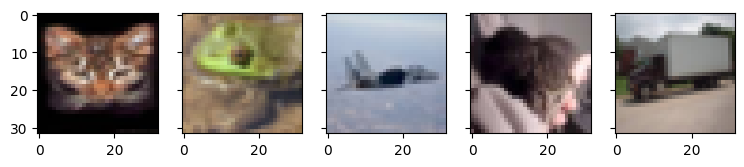

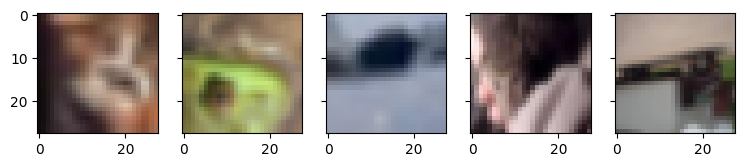

In [ ]:
import torch
import numpy as np
import PIL

from torch.utils.data import Dataset
from torch.utils.data import DataLoader

from torchvision import datasets
from torchvision import transforms

import matplotlib.pyplot as plt
from PIL import Image


RANDOM_SEED = 123
BATCH_SIZE = 10

custom_transform = transforms.Compose([transforms.ToTensor()])


# Note transforms.ToTensor() scales input images
# to 0-1 range
train_dataset = datasets.CIFAR10(root='data',
                                 train=True,
                                 transform=custom_transform,
                                 download=True)

train_loader = DataLoader(dataset=train_dataset,
                          batch_size=BATCH_SIZE,
                          num_workers=0,
                          shuffle=True)

torch.manual_seed(RANDOM_SEED)
for images, labels in train_loader:
    images1 = images
    break

fig, axs = plt.subplots(1, 5, figsize=(9, 3), sharey=True)
for i in range(5):
    axs[i].imshow(np.transpose(images1[i], (1, 2, 0)))

custom_transform = transforms.Compose([
    transforms.RandomResizedCrop((28, 28)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.ToTensor()])


# Note transforms.ToTensor() scales input images
# to 0-1 range
train_dataset = datasets.CIFAR10(root='data',
                                 train=True,
                                 transform=custom_transform,
                                 download=False)

train_loader = DataLoader(dataset=train_dataset,
                          batch_size=BATCH_SIZE,
                          num_workers=0,
                          shuffle=True)

torch.manual_seed(RANDOM_SEED)
for images, labels in train_loader:
    images2 = images
    break

fig, axs = plt.subplots(1, 5, figsize=(9, 3), sharey=True)
for i in range(5):
    axs[i].imshow(np.transpose(images2[i], (1, 2, 0)))

- If you're participating in a computer vision competition, consider using the library called `Albumentations`. It offers faster processing speeds compared to `torchvision.transform`.
  - [link](https://github.com/albumentations-team/albumentations)

### c. Methods for addressing class imbalance

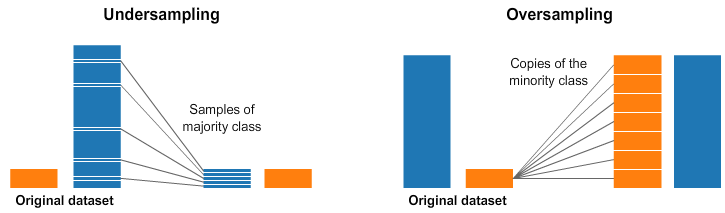

**Class imbalance** refers to a situation in classification problems where one class has a significantly larger number of samples compared to the other class. For instance, in binary classification, one class (typically the majority class) appears at a much higher rate, while the other class (typically the minority class) is relatively rare.

Understanding why **class imbalance needs to be addressed** can be explained through the following reasons:

1. **Biased Model Training**: Severe class imbalance can lead to models being biased towards the majority class, causing them to predict the majority class accurately but perform poorly on the minority class.

2. **Prediction Imbalance**: Excessive class imbalance may lead models to predict all inputs as the majority class, resulting in very few predictions for the minority class.

3. **Metric Distortion**: Accuracy can be an inappropriate performance measure in the presence of class imbalance. Even if a model predicts all inputs as the majority class, it can still achieve a high accuracy.

Here are methods to address class imbalance in a classification task:

1. **Oversampling**:
   - Increase the number of samples in the minority class to balance the classes.
   - A common oversampling technique is SMOTE (Synthetic Minority Over-sampling Technique).

2. **Undersampling**:
   - Reduce the number of samples in the majority class to achieve balance.
   - A drawback is the potential loss of information and important details in the majority class.

4. **Class Weighting**:
   - Assign higher weights to the minority class during model training to encourage better learning of the minority class.

5. **Use Different Performance Metrics**:
   - When dealing with class imbalance, consider metrics beyond accuracy, such as precision, recall, F1-score, ROC curves, and AUC.

6. **Loss Functions for Handling Class Imbalance**
   - Specially designed loss functions are employed to encourage models to address class imbalance and focus on the minority class. Here are examples of loss functions commonly used for handling class imbalance:
     - Weighted Cross-Entropy Loss
     - Focal Loss
     - ... (Various other loss functions)

   - These loss functions help guide the model to better learn the minority class and prove effective in tackling class imbalance issues. The choice of a particular loss function depends on the specific problem and data distribution.

### d. Logging tools

Logging tools play a crucial role in various aspects of online AI competitions, including model training, experiment management, collaboration, visualization, and hyperparameter tuning.

The reasons to use logging tools like TensorBoard and Weights & Biases (wandb) in online AI competitions are as follows:

1. **Experiment Tracking**: These tools allow for systematic tracking of model training and experiments. They record and manage the training process, hyperparameter settings, performance metrics, model weights, graphs, and logs.

2. **Visualization**: TensorBoard and wandb provide visualization and monitoring of the training process. This includes visualizing training curves, metric changes, histograms, images, and TensorBoard's graph, among others.

3. **Hyperparameter Tuning**: Logging tools enable the recording and experimentation of various hyperparameter settings, helping quickly identify which configurations yield the best results.

4. **Collaboration**: When working with a team in online competitions, logging tools make it easy to share and collaborate on experiment results and model performance with team members.

I personally prefer [Wandb](https://docs.wandb.ai/quickstart). Here is an example of usage.

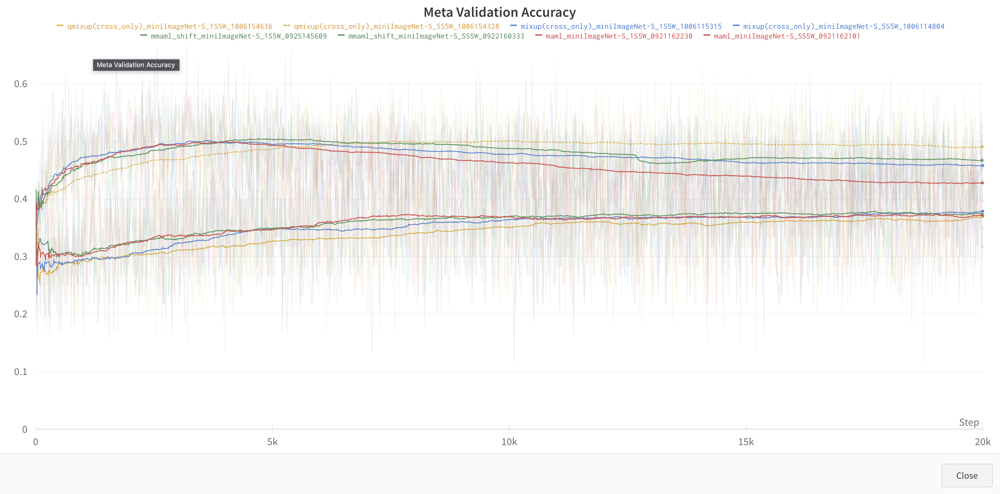

Install the CLI and Python library for interacting with the Weights and Biases API:

In [ ]:
!pip install wandb

Next, import the W&B Python SDK and log in:

In [ ]:
wandb.login()

Provide [your API key](https://wandb.ai/authorize) when prompted.

Initialize a W&B Run object in your Python script or notebook with `wandb.init()` and pass a dictionary to the `config` parameter with key-value pairs of hyperparameter names and values:

In [ ]:
run = wandb.init(
    # Set the project where this run will be logged
    project="my-awesome-project",
    # Track hyperparameters and run metadata
    config={
        "learning_rate": 0.01,
        "epochs": 10,
    })

A [run](https://docs.wandb.ai/guides/runs) is the basic building block of W&B. You will use them often to [track metrics](https://docs.wandb.ai/guides/track), [create logs](https://docs.wandb.ai/guides/artifacts), [create jobs](https://docs.wandb.ai/guides/launch), and more.

Putting it all together, your training script might look similar to the following code example.

In [ ]:
# train.py
import wandb
import random # for demo script

wandb.login()

epochs=10
lr=0.01

run = wandb.init(
    # Set the project where this run will be logged
    project="my-awesome-project",
    # Track hyperparameters and run metadata
    config={
        "learning_rate": lr,
        "epochs": epochs,
    })

offset = random.random() / 5
print(f"lr: {lr}")

# simulating a training run
for epoch in range(2, epochs):
    acc = 1 - 2 ** -epoch - random.random() / epoch - offset
    loss = 2 ** -epoch + random.random() / epoch + offset
    print(f"epoch={epoch}, accuracy={acc}, loss={loss}")
    wandb.log({"accuracy": acc, "loss": loss})


Navigate to the W&B App at https://wandb.ai/home to view how the metrics we logged with W&B (accuracy and loss) improved during each training step.

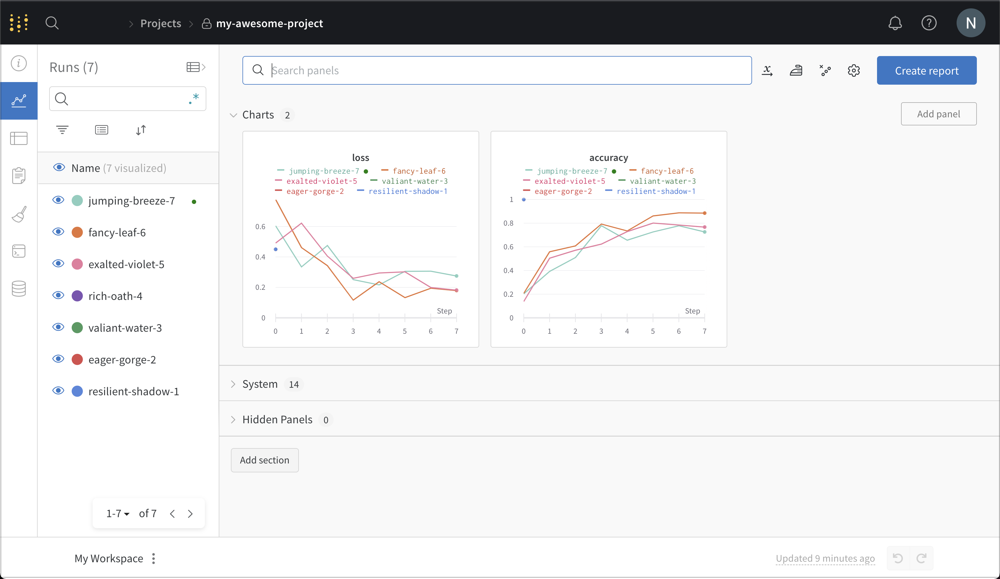

The image above shows the loss and accuracy that was tracked from each time we ran the script above. Each run object that was created is show within the **Runs** column. Each run name is randomly generated.

### e. If there's not enough GPU memory

If you encounter GPU memory shortage while training an AI model, you can try the following approaches:

1. **Adjust Batch Size**: Reduce the batch size used during model training. Smaller batch sizes require less memory and can help alleviate GPU memory issues, although it may necessitate more iterations.

2. **Modify Model Architecture**: Modify your model's architecture to use a lighter-weight model, which can reduce memory requirements.

3. **Mixed Precision Training**: Employ mixed-precision training using libraries like NVIDIA's [APEX](https://github.com/NVIDIA/apex). This involves converting model weights to float16 format and optimizing GPU memory usage.

4. **Gradient Accumulation**: Implement gradient accumulation to accumulate gradients from multiple mini-batches before performing a single update. This can help reduce memory usage while keeping a larger effective batch size.

### f. review past competitions

- Most online AI competitions make the winning participants' code available to the public. If a competition similar to the one you are currently participating in has been held in the past, you can refer to the code written by the winners of that competition to see what strategies they used.
- There are many particularly helpful notebooks on Kaggle.

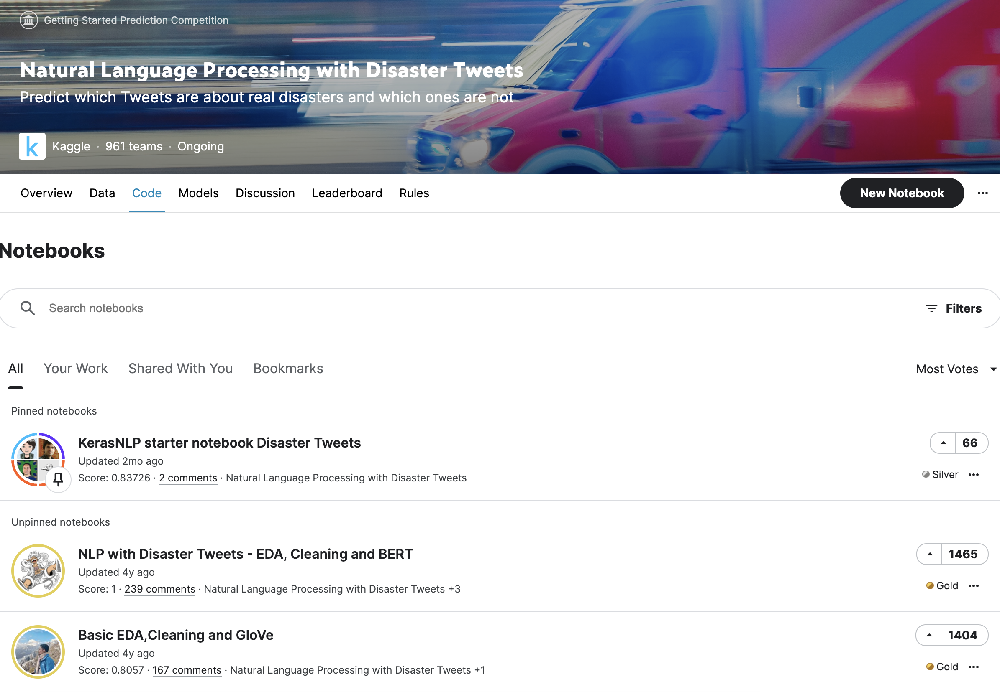

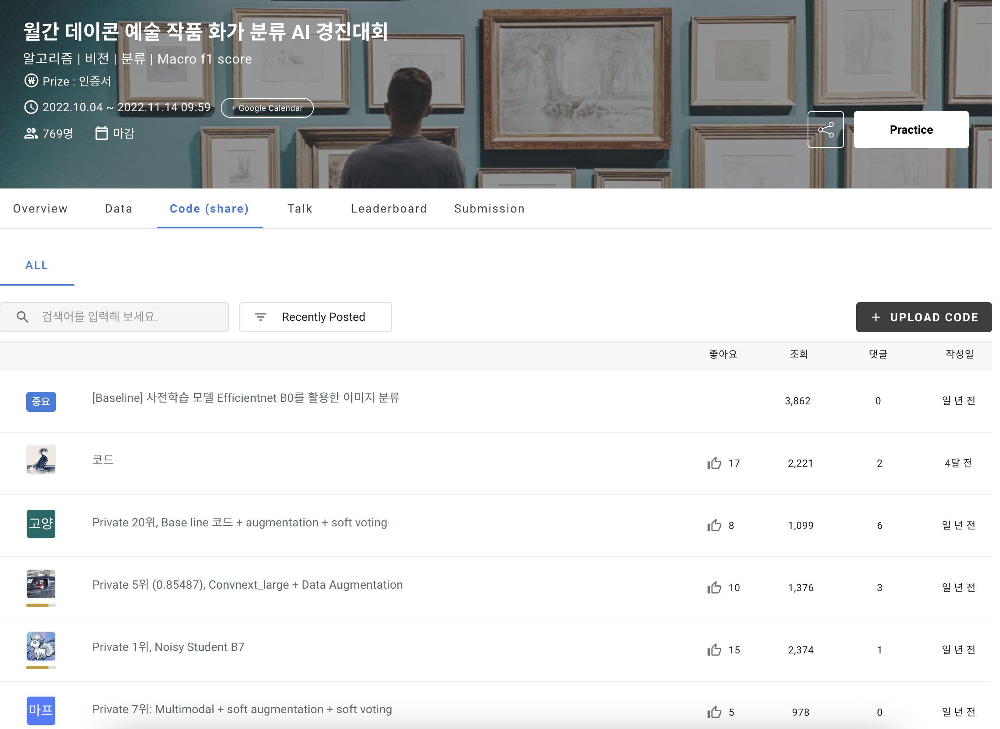

### g. hyperparameter searching


**Hyperparameter searching** refers to the process of systematically exploring and optimizing the hyperparameters of a AI model to achieve better performance. Hyperparameters are configuration settings that are not learned from the data but are set prior to training a model. These settings have a significant impact on a model's performance, and finding the best combination of hyperparameters is crucial for achieving optimal results in machine learning tasks.

Here are some of the common approaches:

1. **Grid Search**: Grid search involves specifying a range of values for each hyperparameter and exhaustively trying all possible combinations. While it is thorough, it can be computationally expensive, especially with a large hyperparameter space.

2. **Random Search**: In random search, you randomly sample hyperparameter combinations from predefined ranges. This approach is more efficient than grid search and often finds good solutions quickly.

3. **Bayesian Optimization**: Bayesian optimization employs probabilistic models to predict which hyperparameter combinations are likely to yield the best results. It efficiently explores the hyperparameter space, making it a powerful approach for optimization.

4. **Automated Machine Learning (AutoML)**: AutoML platforms, such as Google AutoML and H2O.ai, automate the process of hyperparameter optimization. They perform extensive search and tuning, making machine learning more accessible to non-experts.

I personally prefer [Wandb Sweeps](https://docs.wandb.ai/guides/sweeps).

## Contributor

- Jungwook Seo, Mingi Hong
  - TA
- Junbo Jang
  - Rank 1 on Dacon
- Heewon Lee
  - Rank 4 on Dacon